# Test Scratches of the the Wolfram Language

### Hydrogen atom wave_functions

{-Graphics3D-, -Graphics3D-, -Graphics3D-}
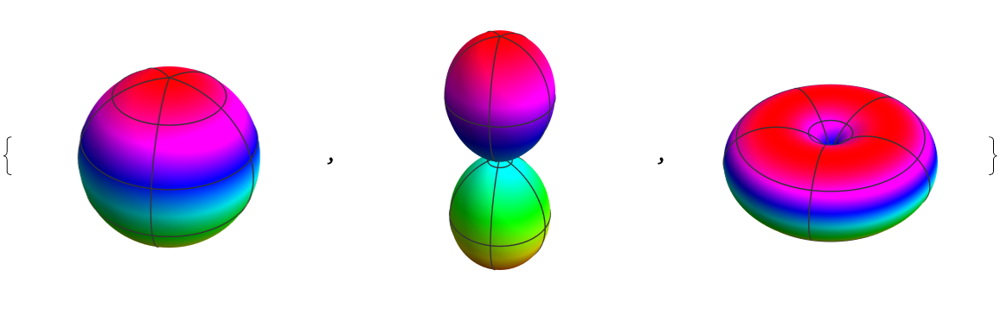

In [1]:
{SphericalPlot3D[ 
  Abs[SphericalHarmonicY[0, 0, r, w]]^2, {r, 0, Pi}, {w, 0, 2 Pi},  
  Boxed -> False, Axes -> False, PlotPoints -> 150,  
  ColorFunction -> Function[{r, w, z}, Hue[z]], Mesh -> 4],  
 SphericalPlot3D[ 
  Abs[SphericalHarmonicY[1, 0, r, w]]^2, {r, 0, Pi}, {w, 0, 2 Pi},  
  Boxed -> False, Axes -> False, PlotPoints -> 150,  
  ColorFunction -> Function[{r, w, z}, Hue[z]], Mesh -> 4],  
 SphericalPlot3D[ 
  Abs[SphericalHarmonicY[1, 1, r, w]]^2, {r, 0, Pi}, {w, 0, 2 Pi},  
  Boxed -> False, Axes -> False, PlotPoints -> 150,  
  ColorFunction -> Function[{r, w, z}, Hue[z]], Mesh -> 4]}

-Graphics3D-

-Graphics3D-   -Graphics3D-

-Graphics3D-   -Graphics3D-   -Graphics3D-

-Graphics3D-   -Graphics3D-   -Graphics3D-   -Graphics3D-
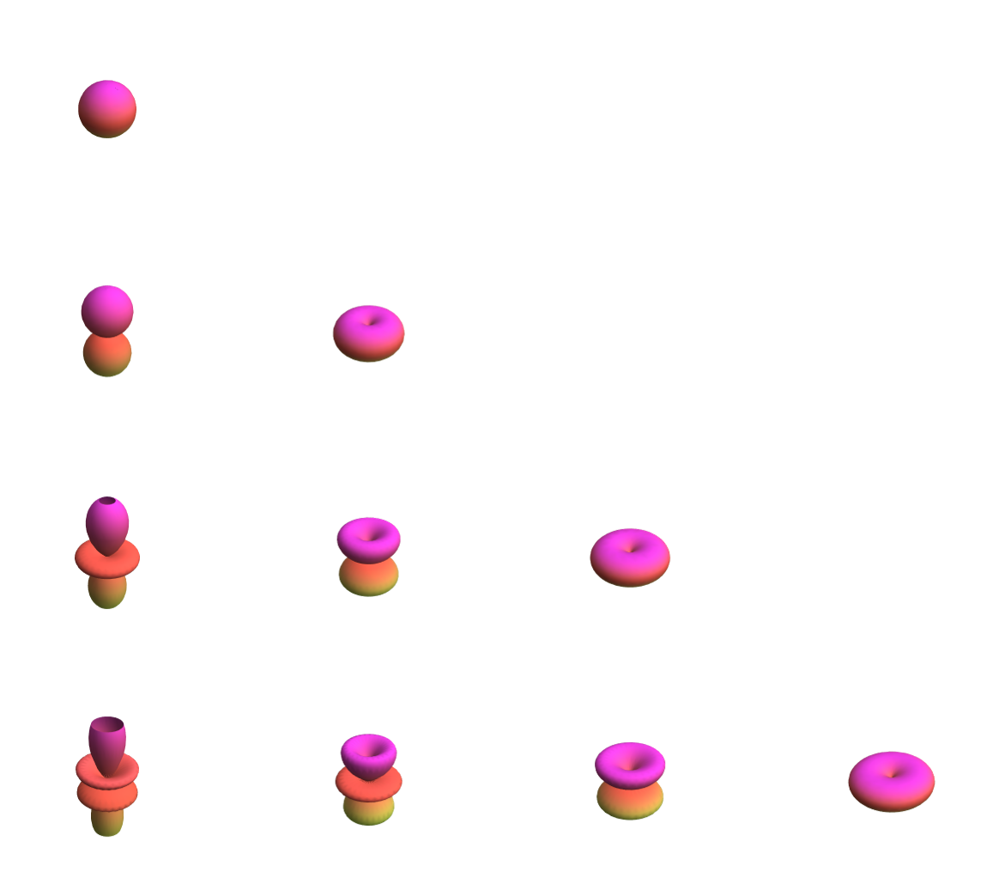

In [2]:
TableForm@ 
 Table[SphericalPlot3D[ 
   Evaluate@Abs@SphericalHarmonicY[l, m, \[Theta], \[Phi]], {\[Theta], 
     0, Pi}, {\[Phi], 0, 2 Pi}, PlotRange -> 0.6, Mesh -> None,  
   Boxed -> False, Axes -> None, ImageSize -> 125,  
   ColorFunction -> "NeonColors"], {l, 0, 3}, {m, 0, l}] 

{{Labeled[-Graphics3D-, n = 1, ℓ = 0, m = 0]}}
{{Labeled[-Graphics3D-, n = 2, ℓ = 0, m = 0]}, 
 
>   {Labeled[-Graphics3D-, n = 2, ℓ = 1, m = 0], 
 
>    Labeled[-Graphics3D-, n = 2, ℓ = 1, m = 1]}}
{{Labeled[-Graphics3D-, n = 3, ℓ = 0, m = 0]}, 
 
>   {Labeled[-Graphics3D-, n = 3, ℓ = 1, m = 0], 
 
>    Labeled[-Graphics3D-, n = 3, ℓ = 1, m = 1]}, 
 
>   {Labeled[-Graphics3D-, n = 3, ℓ = 2, m = 0], 
 
>    Labeled[-Graphics3D-, n = 3, ℓ = 2, m = 1], 
 
>    Labeled[-Graphics3D-, n = 3, ℓ = 2, m = 2]}}
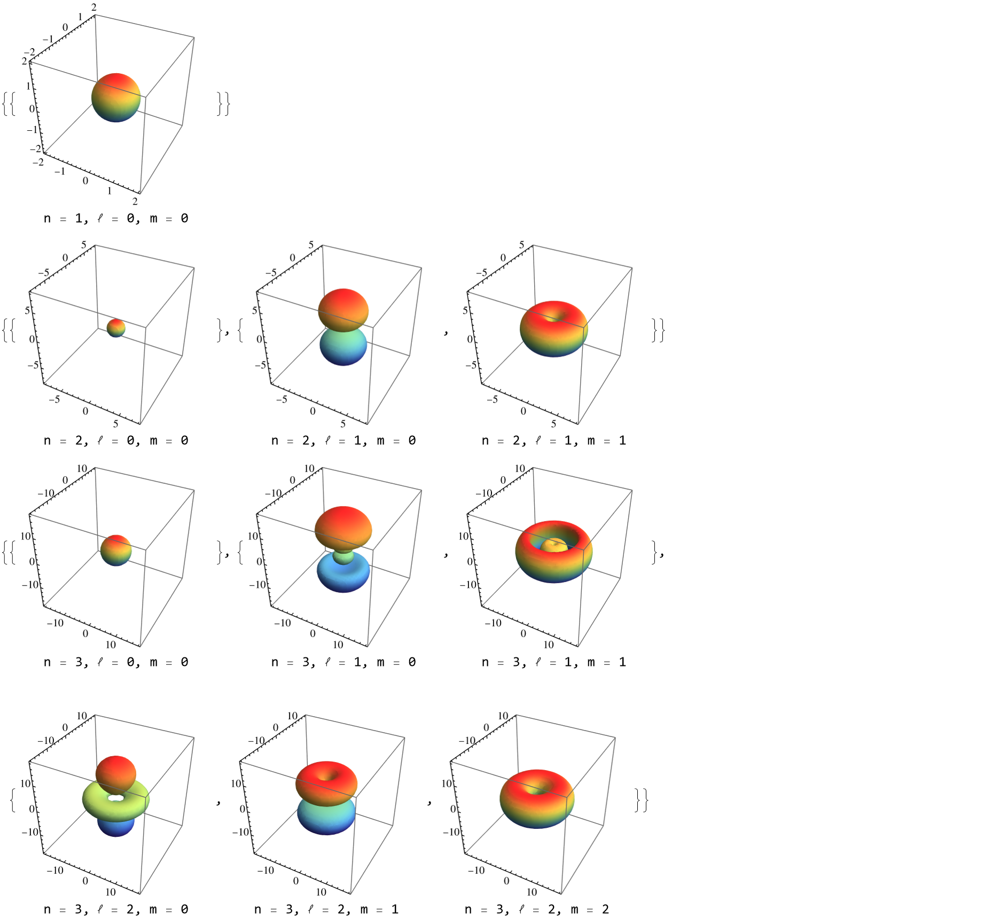

In [3]:
Clear[rMin, rMax, r, \[Theta], \[Phi]]; 
{rMin[n_, l_], rMax[n_, l_]} =  
  r /. Simplify[Solve[(l*(l + 1))/r^2 - 2/r == -(1/n^2), r], n > 0]; 
sphericalToCartesian =  
  Thread[{r, \[Theta], \[Phi]} -> {Sqrt[x^2 + y^2 + z^2],  
     ArcCos[z/Sqrt[x^2 + y^2 + z^2]], Arg[x + I*y]}]; 
\[Psi][n_, l_, m_][ 
  r_, \[Theta]_, \[Phi]_] := (Sqrt[(n - l - 1)!/(n + l)!]*((2*r)/n)^ 
     l*(2/n^2)*LaguerreL[n - l - 1, 2*l + 1, (2*r)/n]* 
    SphericalHarmonicY[l, m, \[Theta], \[Phi]])/E^(r/n) 
ClearAll[plotOrbital]; 
plotOrbital[f_, range_, contour_, opt : OptionsPattern[]] :=  
 RegionPlot3D[ 
  Evaluate[Abs[f[r, \[Theta], \[Phi]] /. sphericalToCartesian]^2 >  
    contour], {x, -range, range}, {y, -range, range}, {z, -range,  
   range}, opt, Mesh -> False, PlotPoints -> 35,  
  ColorFunction -> "Rainbow", Lighting -> "Neutral",  
  PlotTheme -> "Classic"] 
grid = Table[ 
   Labeled[plotOrbital[\[Psi][n, l, m], 2*n^2, 0.05/n^6],  
    Row[{"n = ", n, ", \[ScriptL] = ", l, ", m = ", m}]], {n, 1,  
    3}, {l, 0, n - 1}, {m, 0, l}]; 
Column[grid] 

Manipulate[If[l >= n, l = n - 1]; If[m > l, m = l]; 
 
>    DensityPlot[Module[{r = Norm[{x, 0, z}]}, 
 
             2             2                     z
>      4 Pi r  Rnl[n, l, r]  Re[Ylm[l, m, ArcCos[-], ArcTan[x, 0]] 
                                                 r
 
                                     z
>         Conjugate[Ylm[l, m, ArcCos[-], ArcTan[x, 0]]]]], {x, -side, side}, 
                                     r
 
>     {z, -side, side}, Mesh -> False, Frame -> False, PlotPoints -> Round[resolution], 
 
>     ColorFunctionScaling -> True, ColorFunction -> SunsetColors, 
 
                         scale
>     PlotRange -> {0, 10     }], {{n, 8, principal quantum number}, 1, 8, 1, 
 
>    ControlType -> Setter}, {{l, 3, angular momentum}, Dynamic[Range[0, n - 1]], 
 
>    ControlType -> SetterBar}, {{m, 1, magnetic quantum number}, Dynamic[Range[0, l]], 
 
>    ControlType -> SetterBar}, {{side, 40, Length of a side}, 1, 200, 
 
>    ControlType -> Dynamic[Slider[Dynamic[side]]]}, 
 
>   {{scale, 16, Vertical Scale}, 1, 30, 
 
>    ControlType -> Dynamic[Slider[Dynamic[scale]]]}, 
 
>   {{resolution, 40, Resolution}, 30, 100, 
 
>    ControlType -> Dynamic[Slider[Dynamic[scale]]]}]
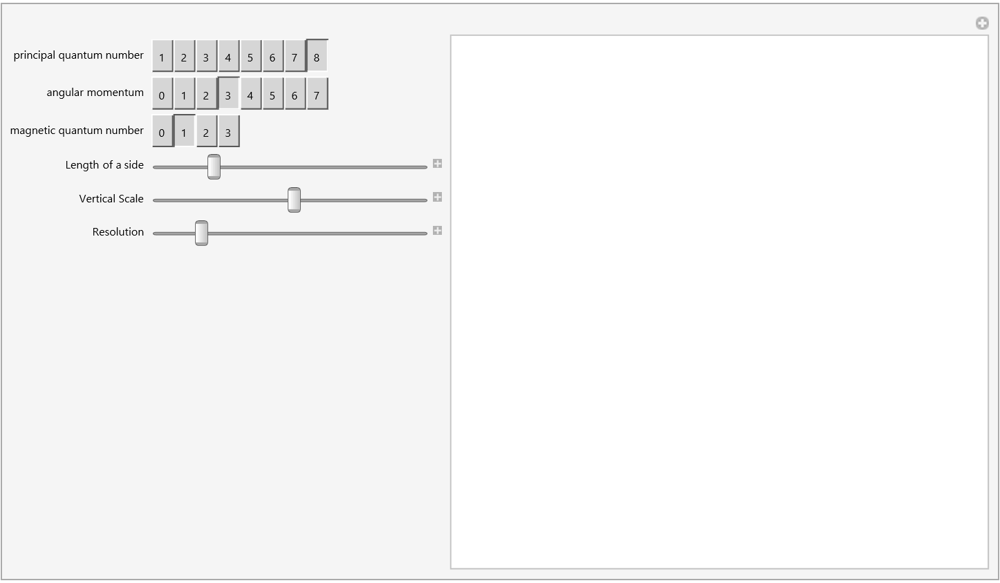

In [11]:
Rnl[n_,l_,r_] := (r^l)*Exp[-r/2]*LaguerreL[n-l-1, 2*l + 1,r]; 
Ylm[l_, m_, theta_, phi_] := SphericalHarmonicY[l, m, theta, phi]; 
 
Manipulate[If[l >= n, l = n - 1]; 
 If[m > l, m = l]; 
 DensityPlot[ 
  Module[{r = Norm[{x, 0, z}]},  
   4 \[Pi] r^2 (Rnl[n, l, r])^2 Re[ 
     Ylm[l, m, ArcCos[z/r], ArcTan[x, 0]]* 
      Conjugate[Ylm[l, m, ArcCos[z/r], ArcTan[x, 0]]]] 
    ], 
  {x, -side, side}, {z, -side, side}, Mesh -> False, Frame -> False,  
  PlotPoints -> Round[resolution], ColorFunctionScaling -> True,  
  ColorFunction -> "SunsetColors",  
  PlotRange -> {0, 10^scale}], {{n, 8, "principal quantum number"}, 1, 
   8, 1, ControlType -> Setter}, {{l, 3, "angular momentum"},  
  Range[0, n - 1],  
  ControlType -> SetterBar}, {{m, 1, "magnetic quantum number"},  
  Range[0, l],  
  ControlType -> SetterBar}, {{side, 40, "Length of a side"}, 1, 200,  
  ControlType -> Slider[Dynamic[side]]}, {{scale, 16,  
   "Vertical Scale"}, 1, 30, ControlType -> Slider[Dynamic[scale]]}, 
 {{resolution, 40, "Resolution"}, 30, 100,  
  ControlType -> Slider[Dynamic[scale]]} 
 ] 